In [ ]:
!pip install imageio

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation
import imageio
import os
from IPython.display import Image, HTML, display

# 🧠 Matrix Exponentials, Eigenvalues, and Quantum / ODE Time Evolution  
### *A Guided Exploration Through Linear Algebra, Differential Equations, and Quantum Dynamics*

This notebook introduces the theory and applications of **matrix exponentials** through explicit computations, classical differential equations, and quantum dynamics.  
A central theme throughout is the importance of **eigenvalues and eigenvectors** in understanding linear transformations and time evolution.

---
# **Introduction**

This notebook explores how **matrix exponentials**, **eigenvalues**, and **eigenvectors** shape the behavior of linear systems in both classical differential equations and quantum mechanics.  
We begin with the foundations—spectral decomposition and expectations of observables—and gradually build toward powerful applications such as:

- computing eigenvalues and eigenvectors from first principles,
- understanding the spectral theorem and expectation values in quantum states,
- expressing time evolution through the matrix exponential  
  $$e^{At},$$
- solving linear ODE systems using  
  $$\frac{d}{dt}\vec{x}(t) = A\,\vec{x}(t),$$
- representing Hamiltonians as matrices and solving the Schrödinger equation  
  $$i\frac{d}{dt}\lvert\psi(t)\rangle = H \lvert\psi(t)\rangle,$$
- visualizing quantum state evolution on the Bloch sphere,
- and deriving the identity  
  $$e^{iA\theta} = I\cos\theta + iA\sin\theta, \qquad (A^2 = I),$$
  which underlies single-qubit rotation gates.

---

# **Purpose of This Notebook**

By the end of this exploration, you will have:

- computed eigenvalues, eigenvectors, and diagonalized matrices,
- applied the spectral theorem to compute quantum expectation values,
- solved ODEs using the matrix exponential \($e^{At}$\) and verified them numerically,
- visualized trajectories of linear dynamical systems,
- simulated quantum evolution generated by a matrix Hamiltonian,
- implemented time-dependent Schrödinger dynamics using PennyLane,
- explored the Bloch sphere and rotations generated by Pauli matrices,
- and determined evolution times that yield target quantum state probabilities.

This notebook aims to build **deep intuition** for how linear operators evolve systems—  
whether classical trajectories or quantum states—through the unifying framework of **matrix exponentials**.

A strong understanding of these principles forms the backbone of both  
**modern applied mathematics** and **quantum information science**.

---

# 📌 Part 1 — Eigenvalues, Eigenvectors, and the Spectral Theorem

We begin with the Hermitian matrix

$$
A =
\begin{bmatrix}
2 & 1 \\
1 & 2
\end{bmatrix}.
$$

You will compute its eigenvalues, eigenvectors, and reconstruct the matrix using the *spectral theorem*:

$$
A = \sum_i \lambda_i \, |v_i\rangle \langle v_i|.
$$

---

# Part 1 — Eigenvalues, Eigenvectors, Spectral Theorem, Expectation Values
1.1 Eigenvalues and Eigenvectors of $A$

---

## **Task 1.1 — Compute Eigenvalues and Eigenvectors by Hand**

1. Compute the characteristic polynomial:
   $$
   \det(A - \lambda I).
   $$
2. Solve for eigenvalues:
   $$
   \lambda_1, \ \lambda_2.
   $$
3. Find corresponding eigenvectors.
4. Normalize them.

### **Guiding Questions**
- Why must a Hermitian matrix have real eigenvalues?
- Why are eigenvectors of distinct eigenvalues orthogonal?

In [14]:
import numpy as np
import matplotlib.pyplot as plt

# Define the observable A
A = np.array([[2, 1],
              [1, 2]], dtype=float)

# Compute eigenvalues and eigenvectors
eigvals, eigvecs = np.linalg.eig(A) # eigenvalues and eigenvectors as lists [0] and [1]

print("Matrix A:\n", A)
print("\nEigenvalues:\n", eigvals)
print("\nEigenvectors (columns):\n", eigvecs)

# Note:
# - eigvals[i] is λ_i
# - eigvecs[:, i] is the corresponding eigenvector |v_i> #eigenvectors is in reversed order

"""
TASK: Check the property of eigenvector and eigenvalues
A|v_i> = λ_i |v_i>
In python, check that:
A@eigvecs[1] = eigvals[0]*eigvecs[0]
A@eigvecs[0] = eigvals[1]*eigvecs[1]
"""

Matrix A:
 [[2. 1.]
 [1. 2.]]

Eigenvalues:
 [3. 1.]

Eigenvectors (columns):
 [[ 0.70710678 -0.70710678]
 [ 0.70710678  0.70710678]]


'\nTASK: Check the property of eigenvector and eigenvalues\nA|v_i> = λ_i |v_i>\nIn python, check that:\nA@eigvecs[1] = eigvals[0]*eigvecs[0]\nA@eigvecs[0] = eigvals[1]*eigvecs[1]\n'

1.2 Spectral Reconstruction of $A$

---

## **Task 1.2 — Verify the Spectral Theorem**

Using your eigenvalues and eigenvectors, construct:

$$
A_{\text{reconstructed}}
=
\lambda_1 |v_1\rangle\langle v_1|
+
\lambda_2 |v_2\rangle\langle v_2|.
$$

Show numerically that:

$$
A_{\text{reconstructed}} = A.
$$

In [ ]:
# Reconstruct A from its spectral decomposition A = Σ λ_i |v_i><v_i|

A_reconstructed = np.zeros_like(A, dtype=np.complex128)

for i in range(len(eigvals)):
    v = eigvecs[:, i].reshape(-1, 1)     # column vector |v_i>
    #-----------------------------------------------
    """
    TASK: reconstruct matrix A by recombining from spectral theorem
    (v @ v.conj().T) denotes the outer product of each eigenvector
    eigvals[i] denotes each eigenvalues
    """
    A_reconstructed += # add the combination of eigenvalue*outer product of eigenvector
    #-----------------------------------------------

    
print("Reconstructed A (from spectral theorem):\n", A_reconstructed)

Reconstructed A (from spectral theorem):
 [[2.+0.j 1.+0.j]
 [1.+0.j 2.+0.j]]


Expectation values and Variance

---

## **Task 1.3 — Expectation Values of an Observable (take a look)**

Given quantum state

$$
|\psi\rangle =
\frac{1}{\sqrt{5}}
\begin{bmatrix}
1\\
2
\end{bmatrix},
$$

compute:

1. Expectation value:
   $$
   \langle \psi| A |\psi \rangle.
   $$
2. Variance:
   $$
   \langle A^2 \rangle - \langle A \rangle^2.
   $$
3. Plot expectation value for parameterized states
   $$
   |\psi(\theta)\rangle
   =
   \cos\theta\, |0\rangle
   +
   \sin\theta\, |1\rangle.
   $$


<psi|A|psi> = (2.8+0j)
Variance = (0.3600000000000003+0j)


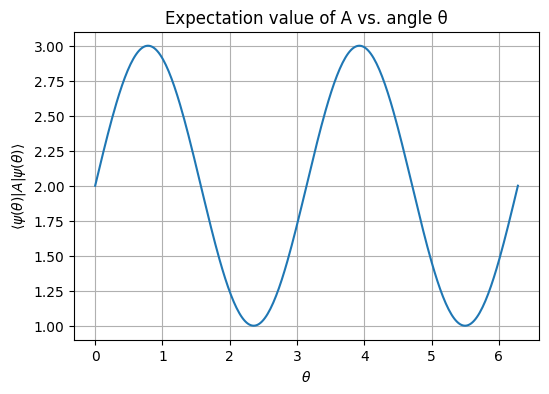

In [ ]:
"""
TASK: Notice the parameter dependence of the measurement probability
for a parameterized quantum state
"""

# Define state |psi> = (1/sqrt(5)) [1, 2]^T
psi = np.array([1, 2], dtype=complex)
psi = psi / np.linalg.norm(psi)

# Expectation value <psi|A|psi>
exp_A = np.vdot(psi, A @ psi)

# A^2 and its expectation
A2 = A @ A
exp_A2 = np.vdot(psi, A2 @ psi)
var_A = exp_A2 - exp_A**2

print(r"<psi|A|psi> =", exp_A)
print("Variance =", var_A)

# Optional: scan over psi(theta) = cos θ |0> + sin θ |1>
thetas = np.linspace(0, 2*np.pi, 300)
exp_vals = []

for theta in thetas:
    psi_theta = np.array([np.cos(theta), np.sin(theta)], dtype=complex)
    psi_theta /= np.linalg.norm(psi_theta)
    exp_vals.append(np.vdot(psi_theta, A @ psi_theta).real)

plt.figure(figsize=(6,4))
plt.plot(thetas, exp_vals)
plt.xlabel(r"$\theta$")
plt.ylabel(r"$\langle \psi(\theta)|A|\psi(\theta)\rangle$")
plt.title("Expectation value of A vs. angle θ")
plt.grid(True)
plt.show()


---

## **Task 1.4 — PennyLane Simulation (take a look)**

Using PennyLane:

1. Prepare $|\psi\rangle$.
2. Implement observable $A$ as a matrix.
3. Compare:
   - analytical expectation,
   - simulated expectation,
   - sampled histogram.

In [14]:
import pennylane as qml
import numpy as np

# One-qubit device (no shots needed for exact expectation)
dev = qml.device("default.qubit", wires=1)

# Define A as a Hermitian observable
A = np.array([[2, 1],
              [1, 2]], dtype=float)
A_obs = qml.Hermitian(A, wires=0)

# same |psi> as before
psi_state = np.array([1, 2], dtype=complex)
psi_state = psi_state / np.linalg.norm(psi_state)

@qml.qnode(dev)
def circuit_for_A():
    """
    Prepare |psi> and measure the expectation value of A.
    """
    # New API: use StatePrep instead of QubitStateVector
    qml.StatePrep(psi_state, wires=0)
    return qml.expval(A_obs)

expval_sim = circuit_for_A()

# analytical value from earlier
exp_A = np.vdot(psi_state, A @ psi_state)

print("Analytical <psi|A|psi> :", exp_A)
print("PennyLane   <A>        :", expval_sim)


Analytical <psi|A|psi> : (2.8+0j)
PennyLane   <A>        : 2.8


# ⚙️ Part 2 — Matrix Exponentials and Solving ODEs

A general linear ODE system in $\mathbb{R}^n$
$$
\frac{d}{dt}\vec{x}(t) = M \vec{x}(t)
$$
has the formal solution
$$
\vec{x}(t) = e^{M t}\,\vec{x}(0),
$$
where the matrix exponential is defined by the power series
$$
e^{M t}
=
\sum_{n=0}^{\infty}
\frac{(M t)^n}{n!}.
$$

In this part, you will:

- first look at a **pure rotation** system (conservative, no damping),
- then study a **damped oscillatory** system,
- verify numerically that the matrix exponential solution really satisfies the ODE.

The key idea:  
> Once you know the matrix $M$, the evolution is completely encoded in $e^{M t}$.



---

## 🔁 Task 2.1 — Matrix Exponential and Pure Rotation

We start with the simpler matrix
$$
M =
\begin{bmatrix}
0 & -1 \\
1 & 0
\end{bmatrix}.
$$

This matrix generates a **pure rotation** in the plane.

### Your tasks:

1. Compute:
   - The eigenvalues and eigenvectors of $M$.
   - Show that the eigenvalues are purely imaginary.

2. Diagonalize $M$:
   $$
   M = V D V^{-1},
   $$
   where $D$ is diagonal.

3. Using the diagonalization, derive
   $$
   e^{M t} = V e^{D t} V^{-1}.
   $$

4. Show that $e^{M t}$ is exactly the $2 \times 2$ rotation matrix
   $$
   R(t) =
   \begin{bmatrix}
   \cos t & -\sin t \\
   \sin t & \cos t
   \end{bmatrix}.
   $$

5. Solve the ODE system
   $$
   \frac{d}{dt}
   \begin{bmatrix}
   x(t) \\
   y(t)
   \end{bmatrix}
   =
   M
   \begin{bmatrix}
   x(t) \\
   y(t)
   \end{bmatrix},
   \qquad
   \vec{x}(0) =
   \begin{bmatrix}
   1 \\
   0
   \end{bmatrix},
   $$
   and interpret the solution **geometrically**:
   - What path does $(x(t),y(t))$ trace out in the plane?
   - Is the motion bounded? periodic?

You may check your analytic result using Python (e.g. `expMt(t)` and plotting $(x(t),y(t))$).


=== Task 2.1: Rotation generator M ===
M =
 [[ 0. -1.]
 [ 1.  0.]]

Eigenvalues of M:
 [0.+1.j 0.-1.j]

Eigenvectors of M (columns):
 [[0.70710678+0.j         0.70710678-0.j        ]
 [0.        -0.70710678j 0.        +0.70710678j]]

At t = π/4:
e^{M t} ≈
 [[ 0.70710678+2.29934717e-17j -0.70710678+0.00000000e+00j]
 [ 0.70710678+0.00000000e+00j  0.70710678+2.29934717e-17j]]

Rotation matrix R(t):
 [[ 0.70710678 -0.70710678]
 [ 0.70710678  0.70710678]]

Close? -> True

=== Task 2.2: ODE with pure rotation ===


/opt/anaconda3/lib/python3.11/site-packages/matplotlib/cbook.py:1719: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/opt/anaconda3/lib/python3.11/site-packages/matplotlib/cbook.py:1355: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


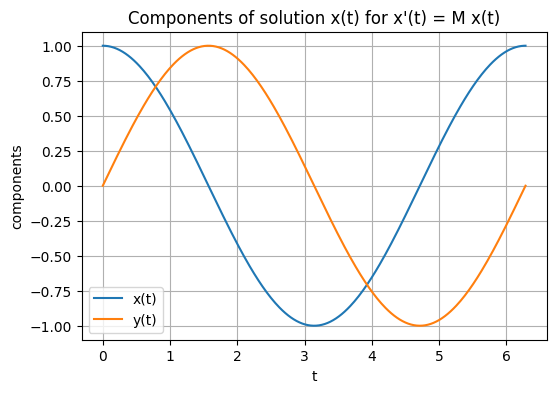

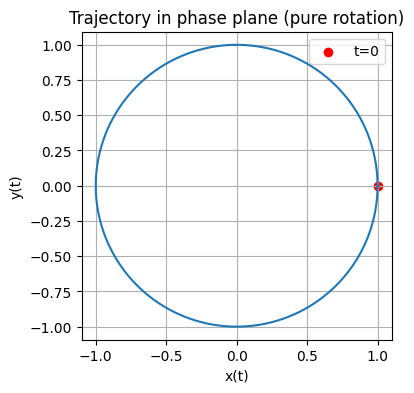

Interpretation: the trajectory lies on the unit circle and rotates at constant speed (pure rotation).


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Math
import sympy as sp

# Helper: robust matrix exponential via factory (no need adjustment)
def expm_factory(A):
    try:
        from scipy.linalg import expm
        def E(t):
            return expm(A * t)
        return E
    except Exception:
        # fallback using eigen-decomposition
        vals, vecs = np.linalg.eig(A)
        invV = np.linalg.inv(vecs)
        def E(t):
            return vecs @ np.diag(np.exp(vals * t)) @ invV
        return E

# Task 2.1 — M = [[0, -1], [1, 0]]: eigenvalues, exp(Mt), rotation
print("=== Task 2.1: Rotation generator M ===")
M = np.array([[0., -1.],
              [1.,  0.]])

#-----------------------------------------------
"""
TASK: Compute:
   - The eigenvalues and eigenvectors of $M$.
   add this code: vals_M, vecs_M = np.linalg.eig(M)
   - Show that the eigenvalues are purely imaginary.
"""
print("M =\n", M)
print("\nEigenvalues of M:\n", vals_M)
print("\nEigenvectors of M (columns):\n", vecs_M)
#-----------------------------------------------


# Build e^{M t} from eigen-decomposition
def expM_t(t):
    V = vecs_M
    D = np.diag(vals_M)
    expD = np.diag(np.exp(vals_M * t))
    return V @ expD @ np.linalg.inv(V)

# Compare e^{M t} with the analytic rotation matrix R(t)
def R(t):
    return np.array([[np.cos(t), -np.sin(t)],
                     [np.sin(t),  np.cos(t)]])

t_check = np.pi / 4  # 45 degrees
EM = expM_t(t_check)
R_analytic = R(t_check)

print("\nAt t = π/4:")
print("e^{M t} ≈\n", EM)
print("\nRotation matrix R(t):\n", R_analytic)
print("\nClose? ->", np.allclose(EM, R_analytic))



---

## 🌊 Task 2.2 — A Damped Oscillatory System

Now we consider a **more realistic** system with damping and oscillations:
$$
A =
\begin{bmatrix}
-0.2 & -2.0 \\
1.0 & -0.2
\end{bmatrix}.
$$

This system can describe a **damped oscillator** in 2D.

### Your tasks:

1. Compute the eigenvalues of $A$ (by hand or with Python) and describe them:
   - Are they real or complex?
   - What is the sign of their real part?

2. Explain what the eigenvalues tell you about the **stability** of the system:
   - Does the origin behave like a **source**, **sink**, or **center**?
   - Do you expect trajectories to spiral in, spiral out, or form closed orbits?

3. Consider the ODE
   $$
   \frac{d}{dt}\vec{x}(t) = A \vec{x}(t), \qquad
   \vec{x}(0) =
   \begin{bmatrix} 1 \\ 0 \end{bmatrix}.
   $$
   Using the fact that
   $$
   \vec{x}(t) = e^{A t} \vec{x}(0),
   $$
   describe qualitatively how you expect $\vec{x}(t)$ to behave as $t \to \infty$.



=== Task 2.2: ODE with pure rotation ===


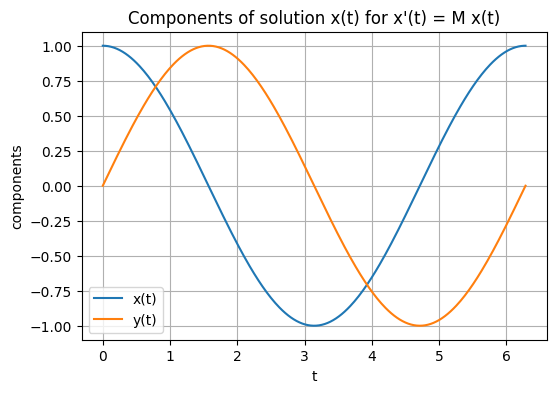

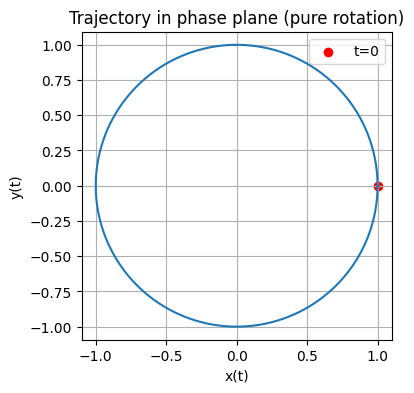

Interpretation: the trajectory lies on the unit circle and rotates at constant speed (pure rotation).


In [ ]:
# Task 2.2 — Solve ODE x'(t) = M x(t), x(0) = (1,0)^T

print("\n=== Task 2.2: ODE with pure rotation ===")


#-----------------------------------------------
"""
TASK: Play around with the initial condition to understand better about the system of ODE
x0_M = np.array([x(0), y(0)]) where x(0) and y(0) are the initial values 
"""
x0_M = np.array([1., 0.]) 
#-----------------------------------------------


T_M = np.linspace(0, 2*np.pi, 300)
X_M = np.array([expM_t(t) @ x0_M for t in T_M]) # the simulation code

# Plot components x(t), y(t)
plt.figure(figsize=(6,4))
plt.plot(T_M, X_M[:,0], label="x(t)")
plt.plot(T_M, X_M[:,1], label="y(t)")
plt.xlabel("t")
plt.ylabel("components")
plt.title("Components of solution x(t) for x'(t) = M x(t)")
plt.legend()
plt.grid(True)
plt.show()

# Plot trajectory in the plane
plt.figure(figsize=(4,4))
plt.plot(X_M[:,0], X_M[:,1])
plt.scatter([x0_M[0]], [x0_M[1]], color="red", label="t=0")
plt.xlabel("x(t)")
plt.ylabel("y(t)")
plt.title("Trajectory in phase plane (pure rotation)")
plt.axis("equal")
plt.grid(True)
plt.xlim(-1.2, 1.2)
plt.ylim(-1.2, 1.2)
plt.legend()
plt.show()

# Interpretation:
print("Interpretation: the trajectory lies on the unit circle and rotates at constant speed (pure rotation).")

---

## 💻 Task 2.3 — Simulating the ODE with the Matrix Exponential

We now use Python to:

- build a function that computes $e^{A t}$,  
- simulate the solution $\vec{x}(t)$ for many time steps,  
- and plot the components and trajectory.

You can use the following **starter code cell**:



=== Task 2.2 / 2.3: Damped oscillatory system A ===
A =
 [[-0.2 -2. ]
 [ 1.  -0.2]]

Eigenvalues of A:
 [-0.2+1.41421356j -0.2-1.41421356j]

Eigenvectors of A (columns):
 [[0.81649658+0.j         0.81649658-0.j        ]
 [0.        -0.57735027j 0.        +0.57735027j]]
λ_0 = -0.2000+1.4142j, Re(λ) = -0.2000, Im(λ) = 1.4142
λ_1 = -0.2000-1.4142j, Re(λ) = -0.2000, Im(λ) = -1.4142

Since Re(λ) < 0 and Im(λ) ≠ 0, trajectories spiral in towards the origin (stable spiral / damped oscillation).


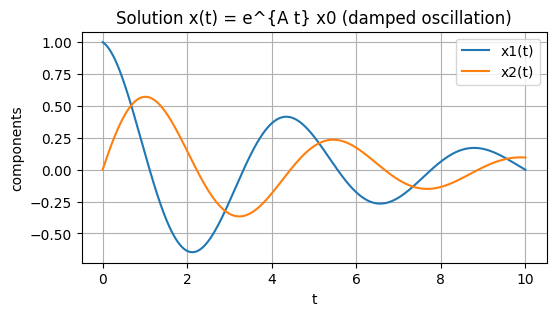

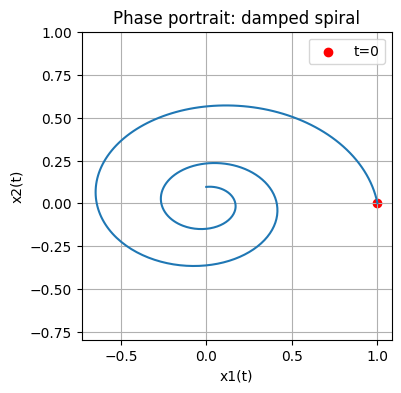

Observation: The trajectory spirals inward due to the negative real part of the eigenvalues (damping).

=== Task 2.3: Different initial conditions ===


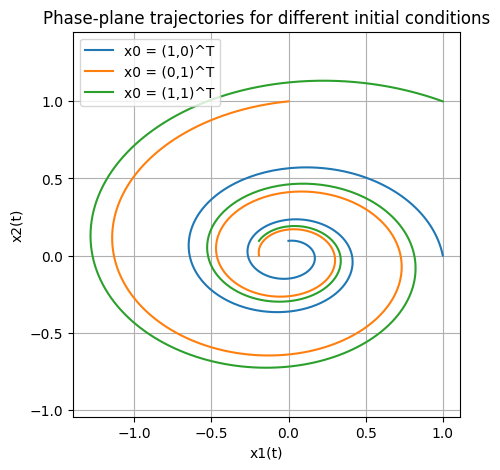

All trajectories spiral into the origin, but start from different points in phase space.

=== Task 2.4: Verifying x'(t) = A x(t) numerically ===

dt = 0.001
Finite-difference derivative ≈ [-1.16912599  0.01272055]
A @ x(t)                 = [-1.16922999  0.01330642]
Residual ||fd - A x(t)|| = 0.0005950310793836873

dt = 0.0001
Finite-difference derivative ≈ [-1.16921963  0.01324782]
A @ x(t)                 = [-1.16922999  0.01330642]
Residual ||fd - A x(t)|| = 5.9503615245622145e-05

dt = 1e-05
Finite-difference derivative ≈ [-1.16922896  0.01330056]
A @ x(t)                 = [-1.16922999  0.01330642]
Residual ||fd - A x(t)|| = 5.950354286593725e-06

As dt → 0, the residual gets very small, confirming that x(t) = e^{A t} x0 satisfies x'(t) = A x(t).


In [ ]:
# ============================================================
# Task 2.2 / 2.3 — Damped oscillatory system with A
# ============================================================

print("\n=== Task 2.2 / 2.3: Damped oscillatory system A ===")

A = np.array([[-0.2, -2.0],
              [ 1.0, -0.2]])

print("A =\n", A)

# Eigenvalues and eigenvectors of A
vals_A, vecs_A = np.linalg.eig(A)
print("\nEigenvalues of A:\n", vals_A)
print("\nEigenvectors of A (columns):\n", vecs_A)

# Brief classification from eigenvalues
for i, lam in enumerate(vals_A):
    print(f"λ_{i} = {lam:.4f}, Re(λ) = {lam.real:.4f}, Im(λ) = {lam.imag:.4f}")
print("\nSince Re(λ) < 0 and Im(λ) ≠ 0, trajectories spiral in towards the origin (stable spiral / damped oscillation).")

# Build matrix exponential for A
E = expm_factory(A)

# Initial condition and simulation
x0_A = np.array([1.0, 0.0])
T_A = np.linspace(0, 10, 401)
X_A = np.array([E(t) @ x0_A for t in T_A])

# Plot components x1(t), x2(t)
plt.figure(figsize=(6,3))
plt.plot(T_A, X_A[:,0], label='x1(t)')
plt.plot(T_A, X_A[:,1], label='x2(t)')
plt.xlabel('t')
plt.ylabel('components')
plt.title('Solution x(t) = e^{A t} x0 (damped oscillation)')
plt.legend()
plt.grid(True)
plt.show()

# Phase-plane trajectory
plt.figure(figsize=(4,4))
plt.plot(X_A[:,0], X_A[:,1])
plt.scatter([x0_A[0]], [x0_A[1]], color='red', label='t=0')
plt.xlabel('x1(t)')
plt.ylabel('x2(t)')
plt.title('Phase portrait: damped spiral')
plt.axis('equal')
plt.grid(True)
plt.legend()
plt.show()

print("Observation: The trajectory spirals inward due to the negative real part of the eigenvalues (damping).")


In [ ]:
# ============================================================
# Task 2.3 extension — Try different initial conditions
# ============================================================


#-----------------------------------------------
"""
TASK: Play around with the initial condition to understand better about the system of ODE
x0_M = np.array([x(0), y(0)]) where x(0) and y(0) are the initial values 
the plot will plot all the case together in a single figure
"""
print("\n=== Task 2.3: Different initial conditions ===")

ICs = {
    "x0 = (1,0)^T": np.array([1.0, 0.0]),
    "x0 = (0,1)^T": np.array([0.0, 1.0]),
    "x0 = (1,1)^T": np.array([1.0, 1.0]),
}
#-----------------------------------------------



plt.figure(figsize=(5,5))
for label, x0 in ICs.items():
    X_traj = np.array([E(t) @ x0 for t in T_A])
    plt.plot(X_traj[:,0], X_traj[:,1], label=label)

plt.xlabel('x1(t)')
plt.ylabel('x2(t)')
plt.title('Phase-plane trajectories for different initial conditions')
plt.axis('equal')
plt.grid(True)
plt.legend()
plt.show()

print("All trajectories spiral into the origin, but start from different points in phase space.")


---

# ⚛️ Part 3 — Solving the Schrödinger Equation

The Schrödinger equation is:

$$
i\frac{d}{dt}|\psi(t)\rangle = H |\psi(t)\rangle.
$$

Its solution is:

$$
|\psi(t)\rangle =
e^{-iHt} |\psi(0)\rangle.
$$

---

## **Task 3.1 — Hamiltonian as a Matrix**

Given Hamiltonian

$$
H =
\begin{bmatrix}
1 & 1 \\
1 & -1
\end{bmatrix},
$$

1. Show it is Hermitian.  
2. Compute eigenvalues and eigenvectors.  
3. Write:

$$
H = \sum_i E_i \, |E_i\rangle \langle E_i|.
$$

In [8]:
H = np.array([[1, 1],
              [1, -1]], dtype=float)

print("H:\n", H)
print("H Hermitian? ->", np.allclose(H, H.T))

E_vals, E_vecs = np.linalg.eig(H)
print("\nEigenvalues of H:\n", E_vals)
print("\nEigenvectors of H (columns):\n", E_vecs)

# Reconstruct H from spectral decomposition
H_recon = np.zeros_like(H, dtype=np.complex128)
for i in range(len(E_vals)):
    v = E_vecs[:, i].reshape(-1, 1)
    H_recon += E_vals[i] * (v @ v.conj().T)

print("\nH reconstructed from spectral form:\n", H_recon)
print("\nClose to original H? ->", np.allclose(H_recon, H))


H:
 [[ 1.  1.]
 [ 1. -1.]]
H Hermitian? -> True

Eigenvalues of H:
 [ 1.41421356 -1.41421356]

Eigenvectors of H (columns):
 [[ 0.92387953 -0.38268343]
 [ 0.38268343  0.92387953]]

H reconstructed from spectral form:
 [[ 1.+0.j  1.+0.j]
 [ 1.+0.j -1.+0.j]]

Close to original H? -> True


---

## **Task 3.2 — Analytical Time Evolution**

Initial state:

$$
|\psi(0)\rangle = |0\rangle =
\begin{bmatrix}
1 \\
0
\end{bmatrix}.
$$

Compute:

$$
|\psi(t)\rangle
=
e^{-iHt} |\psi(0)\rangle.
$$

Plot:

- real and imaginary parts of each component,  
- probabilities  
  $$
  |\langle 0|\psi(t)\rangle|^2,\quad
  |\langle 1|\psi(t)\rangle|^2.
  $$


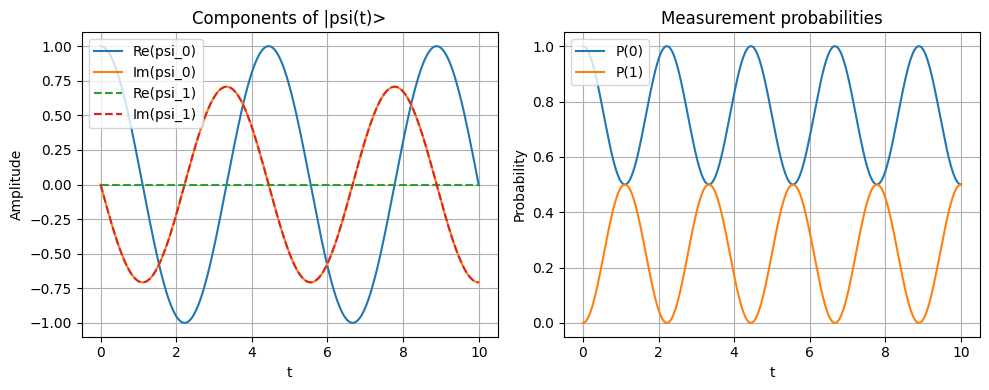

In [9]:
def expm_Ht(t):
    """Compute e^{-i H t} using spectral decomposition."""
    U = E_vecs
    expD = np.diag(np.exp(-1j * E_vals * t))
    return U @ expD @ np.linalg.inv(U)

psi0 = np.array([1.0, 0.0], dtype=complex)

ts = np.linspace(0, 10, 400)
psi_t_list = []
P0 = []
P1 = []

for t in ts:
    U_t = expm_Ht(t)
    psi_t = U_t @ psi0
    psi_t_list.append(psi_t)
    P0.append(np.abs(psi_t[0])**2)
    P1.append(np.abs(psi_t[1])**2)

psi_t_arr = np.array(psi_t_list)

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.plot(ts, psi_t_arr[:,0].real, label="Re(psi_0)")
plt.plot(ts, psi_t_arr[:,0].imag, label="Im(psi_0)")
plt.plot(ts, psi_t_arr[:,1].real, label="Re(psi_1)", linestyle="--")
plt.plot(ts, psi_t_arr[:,1].imag, label="Im(psi_1)", linestyle="--")
plt.xlabel("t")
plt.ylabel("Amplitude")
plt.title("Components of |psi(t)>")
plt.legend()
plt.grid(True)

plt.subplot(1,2,2)
plt.plot(ts, P0, label="P(0)")
plt.plot(ts, P1, label="P(1)")
plt.xlabel("t")
plt.ylabel("Probability")
plt.title("Measurement probabilities")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


---

## **Task 3.3 — PennyLane Simulation**

Implement time evolution in PennyLane using:

- `qml.QubitUnitary(e^{-iHt})`, or  
- Trotter step approximations.

Compare analytical vs simulated results.

In [10]:
dev2 = qml.device("default.qubit", wires=1, shots=None)

@qml.qnode(dev2)
def time_evolution_circuit(t):
    U_t = expm_Ht(t)
    qml.QubitUnitary(U_t, wires=0)
    return qml.state()

t_example = 1.0
psi_analytic = expm_Ht(t_example) @ psi0
psi_sim = time_evolution_circuit(t_example)

print("Analytic |psi(t)> at t=1:\n", psi_analytic)
print("\nPennyLane |psi(t)> at t=1:\n", psi_sim)


Analytic |psi(t)> at t=1:
 [1.55943695e-01-0.698456j 7.83976713e-17-0.698456j]

PennyLane |psi(t)> at t=1:
 [1.55943695e-01-0.698456j 7.83976713e-17-0.698456j]


For fun if you are interested: 3 levels system

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Matrix([
[ 0, Ω1, Ω2],
[Ω1, Δ1,  0],
[Ω2,  0, Δ2]])

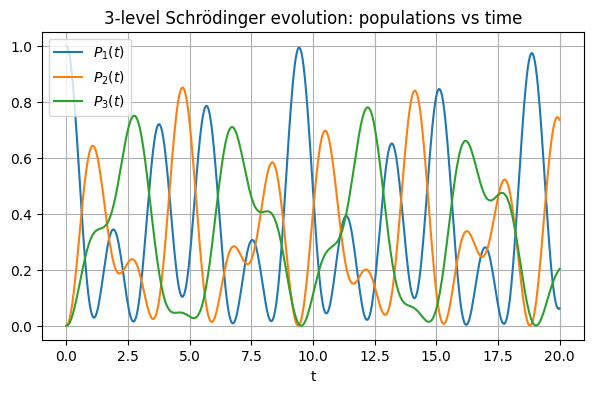

psi(t=0) = [1.+0.j 0.+0.j 0.+0.j]
psi(t=20) = [-0.21433965-0.12751669j  0.85602942+0.04780805j  0.15044699+0.42437216j]


In [17]:
# Generalized Schrödinger equation: 3-level system with detuning and coupling
# -------------------------------------------------------------------------
# i d/dt |ψ(t)⟩ = H |ψ(t)⟩, with H a 3x3 Hermitian matrix (e.g., Lambda or V system)

import numpy as np
import sympy as sp
import matplotlib.pyplot as plt
from IPython.display import display, Math

# Symbolic display
H_sym = sp.Matrix([[0, sp.symbols('Ω1', real=True), sp.symbols('Ω2', real=True)],
                   [sp.symbols('Ω1', real=True), sp.symbols('Δ1', real=True), 0],
                   [sp.symbols('Ω2', real=True), 0, sp.symbols('Δ2', real=True)]])
display(Math(r"i \frac{d}{dt} |\psi(t)\rangle = H |\psi(t)\rangle"))
display(Math(r"H ="))
display(H_sym)

# Numeric Hamiltonian: 3-level Lambda system with detuning and two couplings
Δ1 = 1.0   # detuning for state 2
Δ2 = -0.7  # detuning for state 3
Ω1 = 1.2   # coupling 1-2
Ω2 = 0.8   # coupling 1-3
H = np.array([[0, Ω1, Ω2],
              [Ω1, Δ1, 0],
              [Ω2, 0, Δ2]], dtype=complex)

# Exponential factory for -i H t
try:
    from scipy.linalg import expm
    def U(t):
        return expm(-1j * H * t)
except ImportError:
    vals, vecs = np.linalg.eig(-1j * H)
    invV = np.linalg.inv(vecs)
    def U(t):
        return vecs @ np.diag(np.exp(vals * t)) @ invV

# Initial state: population in state 1
psi0 = np.array([1.0, 0.0, 0.0], dtype=complex)
T = np.linspace(0, 20, 500)
probs = np.array([np.abs(U(t) @ psi0)**2 for t in T])

plt.figure(figsize=(7,4))
plt.plot(T, probs[:,0], label='$P_1(t)$')
plt.plot(T, probs[:,1], label='$P_2(t)$')
plt.plot(T, probs[:,2], label='$P_3(t)$')
plt.xlabel('t')
plt.title('3-level Schrödinger evolution: populations vs time')
plt.legend()
plt.grid(True)
plt.show()

# Print first and last state
print('psi(t=0) =', (U(0) @ psi0))
print('psi(t=20) =', (U(20) @ psi0))


---

# 🔄 Part 4 — Quantum Gates from Matrix Exponentials

For any matrix satisfying:

$$
A^2 = I,
$$

show the identity:

$$
e^{iA \theta}
=
I\cos\theta
+
iA\sin\theta.
$$

(Hint: separate even and odd terms.)

This applies to Pauli matrices.


---

## **Task 4.1 — Single-Qubit Evolution Under $e^{-iXt}$**

Starting from:

$$
|\psi(0)\rangle = |0\rangle,
$$

analyze:

$$
|\psi(t)\rangle
=
e^{-iXt} |0\rangle.
$$

1. Compute analytic form.  
2. Plot evolution on the **Bloch sphere**.  
3. Show this corresponds to rotation around the $x$-axis.

In [12]:
# Pauli X and identity
X = np.array([[0, 1],
              [1, 0]], dtype=complex)
I2 = np.eye(2, dtype=complex)

def expiA_theta(A, theta):
    """Compute e^{i A theta} via eigendecomposition."""
    vals, vecs = np.linalg.eig(A)
    D = np.diag(np.exp(1j * vals * theta))
    return vecs @ D @ np.linalg.inv(vecs)

theta_test = 0.7
lhs = expiA_theta(X, theta_test)
rhs = I2 * np.cos(theta_test) + 1j * X * np.sin(theta_test)

print("e^{i X theta} via eigendecomposition:\n", lhs)
print("\nI cos(theta) + iX sin(theta):\n", rhs)
print("\nClose? ->", np.allclose(lhs, rhs))


e^{i X theta} via eigendecomposition:
 [[7.64842187e-01-1.59226384e-16j 8.31325276e-17+6.44217687e-01j]
 [7.40675350e-17+6.44217687e-01j 7.64842187e-01+5.29440516e-17j]]

I cos(theta) + iX sin(theta):
 [[0.76484219+0.j         0.        +0.64421769j]
 [0.        +0.64421769j 0.76484219+0.j        ]]

Close? -> True


---

## **Task 4.2 — Time Needed to Reach a Target Probability**

Given a desired measurement result:

$$
P(0) = p,\qquad P(1) = 1 - p,
$$

solve for time $t$ such that:

$$
|\langle 0|\psi(t)\rangle|^2 = p.
$$

Verify numerically.

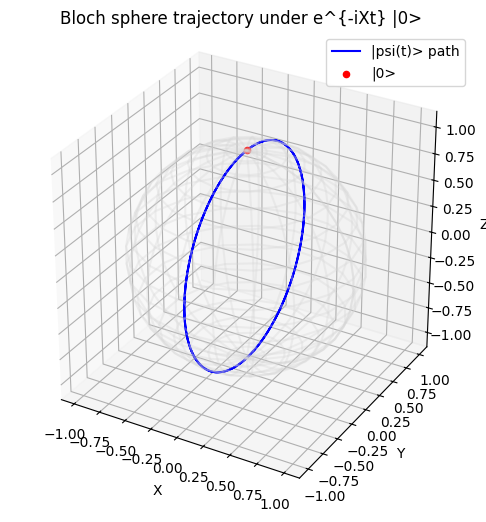

In [7]:
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

def U_X(t):
    """Time-evolution operator e^{-iXt} using closed form."""
    return I2 * np.cos(t) - 1j * X * np.sin(t)

psi0 = np.array([1.0, 0.0], dtype=complex)

def bloch_coords(psi):
    """Return (x, y, z) Bloch coordinates for pure state |psi>."""
    Xp = np.array([[0, 1],[1, 0]], dtype=complex)
    Yp = np.array([[0, -1j],[1j, 0]], dtype=complex)
    Zp = np.array([[1, 0],[0, -1]], dtype=complex)
    
    rho = np.outer(psi, psi.conj())
    x = np.trace(rho @ Xp).real
    y = np.trace(rho @ Yp).real
    z = np.trace(rho @ Zp).real
    return x, y, z

ts = np.linspace(0, 2*np.pi, 200)
bloch_points = []

for t in ts:
    psi_t = U_X(t) @ psi0
    bloch_points.append(bloch_coords(psi_t))

bloch_points = np.array(bloch_points)

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection="3d")

# Bloch sphere wireframe
u = np.linspace(0, np.pi, 20)
v = np.linspace(0, 2*np.pi, 20)
xs = np.outer(np.sin(u), np.cos(v))
ys = np.outer(np.sin(u), np.sin(v))
zs = np.outer(np.cos(u), np.ones_like(v))
ax.plot_wireframe(xs, ys, zs, color="lightgray", alpha=0.3)

# Trajectory
ax.plot(bloch_points[:,0], bloch_points[:,1], bloch_points[:,2], color="blue", label="|psi(t)> path")

# Mark |0>
ax.scatter([0], [0], [1], color="red", label="|0>")

ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
ax.set_title("Bloch sphere trajectory under e^{-iXt} |0>")
ax.legend()
ax.set_box_aspect([1,1,1])

plt.show()


---

# 🎯 Final Challenge

Given Hamiltonian:

$$
H = \alpha X + \beta Z,
$$

initial state:

$$
|\psi(0)\rangle = |0\rangle,
$$

and time evolution:

$$
|\psi(t)\rangle = e^{-iHt} |0\rangle,
$$

find $t$ such that:

$$
P(1) = |\langle 1|\psi(t)\rangle|^2 = 0.8.
$$

Plot the Bloch trajectory and highlight the solution time.

In [8]:
p_target = 0.2  # Example: P(0) = p

# For e^{-iXt}|0>, psi(t) = cos t |0> - i sin t |1>, so P(0) = cos^2 t
t_sol1 = np.arccos(np.sqrt(p_target))
t_sol2 = np.arccos(-np.sqrt(p_target))

print("Target p =", p_target)
print("Possible solutions for t (within [0, pi]):", t_sol1, t_sol2)

for t in [t_sol1, t_sol2]:
    psi_t = U_X(t) @ psi0
    P0_t = np.abs(psi_t[0])**2
    print(f"t = {t:.4f}, P(0) = {P0_t:.4f}")

Target p = 0.2
Possible solutions for t (within [0, pi]): 1.1071487177940904 2.0344439357957027
t = 1.1071, P(0) = 0.2000
t = 2.0344, P(0) = 0.2000


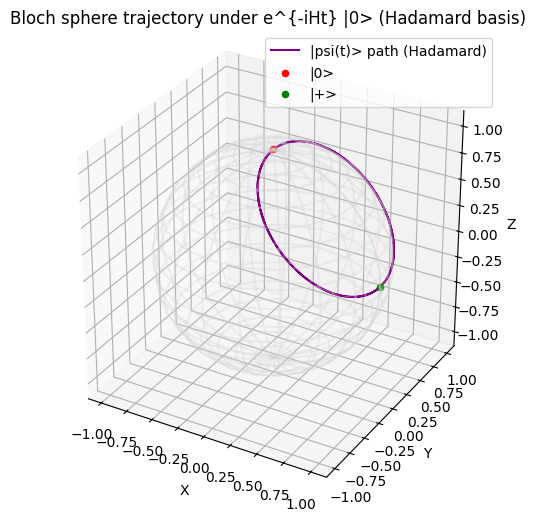

In [18]:
# Bloch sphere trajectory: rotation over the Hadamard basis
# --------------------------------------------------------
# This cell visualizes the trajectory of a qubit initially in |0> under a rotation generated by the Hadamard operator H.

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

# Pauli matrices
X = np.array([[0, 1],[1, 0]], dtype=complex)
Z = np.array([[1, 0],[0, -1]], dtype=complex)
I2 = np.eye(2)

# Hadamard operator
H = (X + Z) / np.sqrt(2)

# Time-evolution operator for Hadamard: U_H(t) = exp(-i H t)
def U_H(t):
    # Use eigendecomposition for exp(-i H t)
    vals, vecs = np.linalg.eigh(H)
    return vecs @ np.diag(np.exp(-1j * vals * t)) @ np.linalg.inv(vecs)

psi0 = np.array([1.0, 0.0], dtype=complex)

def bloch_coords(psi):
    Xp = np.array([[0, 1],[1, 0]], dtype=complex)
    Yp = np.array([[0, -1j],[1j, 0]], dtype=complex)
    Zp = np.array([[1, 0],[0, -1]], dtype=complex)
    rho = np.outer(psi, psi.conj())
    x = np.trace(rho @ Xp).real
    y = np.trace(rho @ Yp).real
    z = np.trace(rho @ Zp).real
    return x, y, z

ts = np.linspace(0, 2*np.pi, 200)
bloch_points = []
for t in ts:
    psi_t = U_H(t) @ psi0
    bloch_points.append(bloch_coords(psi_t))
bloch_points = np.array(bloch_points)

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection="3d")

# Bloch sphere wireframe
u = np.linspace(0, np.pi, 20)
v = np.linspace(0, 2*np.pi, 20)
xs = np.outer(np.sin(u), np.cos(v))
ys = np.outer(np.sin(u), np.sin(v))
zs = np.outer(np.cos(u), np.ones_like(v))
ax.plot_wireframe(xs, ys, zs, color="lightgray", alpha=0.3)

# Trajectory
ax.plot(bloch_points[:,0], bloch_points[:,1], bloch_points[:,2], color="purple", label="|psi(t)> path (Hadamard)")

# Mark |0> and |+>
ax.scatter([0], [0], [1], color="red", label="|0>")
ax.scatter([1], [0], [0], color="green", label="|+>")

ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
ax.set_title("Bloch sphere trajectory under e^{-iHt} |0> (Hadamard basis)")
ax.legend()
ax.set_box_aspect([1,1,1])

plt.show()


In [ ]:
# Bloch sphere trajectory animation: Hadamard rotation as GIF and HTML
# ---------------------------------------------------------------
# This cell animates the rotating state vector under Hadamard evolution and saves as GIF and HTML.

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
import matplotlib.animation as animation
import imageio
import os
from IPython.display import Image, HTML, display

# Pauli matrices and Hadamard
X = np.array([[0, 1],[1, 0]], dtype=complex)
Z = np.array([[1, 0],[0, -1]], dtype=complex)
I2 = np.eye(2)
H = (X + Z) / np.sqrt(2)

def U_H(t):
    vals, vecs = np.linalg.eigh(H)
    return vecs @ np.diag(np.exp(-1j * vals * t)) @ np.linalg.inv(vecs)

def bloch_coords(psi):
    Xp = np.array([[0, 1],[1, 0]], dtype=complex)
    Yp = np.array([[0, -1j],[1j, 0]], dtype=complex)
    Zp = np.array([[1, 0],[0, -1]], dtype=complex)
    rho = np.outer(psi, psi.conj())
    x = np.trace(rho @ Xp).real
    y = np.trace(rho @ Yp).real
    z = np.trace(rho @ Zp).real
    return x, y, z

psi0 = np.array([1.0, 0.0], dtype=complex)
ts = np.linspace(0, 2*np.pi, 60)
bloch_points = []
for t in ts:
    psi_t = U_H(t) @ psi0
    bloch_points.append(bloch_coords(psi_t))
bloch_points = np.array(bloch_points)

# Animation: save frames
frame_files = []
for i, t in enumerate(ts):
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111, projection="3d")
    # Bloch sphere
    u = np.linspace(0, np.pi, 20)
    v = np.linspace(0, 2*np.pi, 20)
    xs = np.outer(np.sin(u), np.cos(v))
    ys = np.outer(np.sin(u), np.sin(v))
    zs = np.outer(np.cos(u), np.ones_like(v))
    ax.plot_wireframe(xs, ys, zs, color="lightgray", alpha=0.3)
    # Trajectory so far
    ax.plot(bloch_points[:i+1,0], bloch_points[:i+1,1], bloch_points[:i+1,2], color="purple")
    # Current state vector
    ax.quiver(0,0,0, bloch_points[i,0], bloch_points[i,1], bloch_points[i,2], color="crimson", arrow_length_ratio=0.15, linewidth=2)
    # Mark |0> and |+>
    ax.scatter([0], [0], [1], color="red", label="|0>")
    ax.scatter([1], [0], [0], color="green", label="|+>")
    ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
    ax.set_title("Bloch sphere: Hadamard rotation")
    ax.set_box_aspect([1,1,1])
    ax.set_xlim([-1,1]); ax.set_ylim([-1,1]); ax.set_zlim([-1,1])
    if i == 0:
        ax.legend()
    plt.tight_layout()
    fname = f'_bloch_frame_{i:03d}.png'
    plt.savefig(fname)
    frame_files.append(fname)
    plt.close(fig)

# Save GIF
gif_path = 'bloch_hadamard.gif'
with imageio.get_writer(gif_path, mode='I', duration=0.08) as writer:
    for fname in frame_files:
        image = imageio.imread(fname)
        writer.append_data(image)
for fname in frame_files:
    os.remove(fname)

# Display GIF inline
#try:
    #display(Image(filename=gif_path))
#except Exception as e:
    #print(f'Could not display GIF: {e}')

# Optionally, create HTML5 video (matplotlib animation)
try:
    import matplotlib.animation as animation
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111, projection="3d")
    u = np.linspace(0, np.pi, 20)
    v = np.linspace(0, 2*np.pi, 20)
    xs = np.outer(np.sin(u), np.cos(v))
    ys = np.outer(np.sin(u), np.sin(v))
    zs = np.outer(np.cos(u), np.ones_like(v))
    ax.plot_wireframe(xs, ys, zs, color="lightgray", alpha=0.3)
    traj, = ax.plot([], [], [], color="purple")
    quiv = [ax.quiver(0,0,0, 0,0,1, color="crimson", arrow_length_ratio=0.15, linewidth=2)]
    ax.scatter([0], [0], [1], color="red", label="|0>")
    ax.scatter([1], [0], [0], color="green", label="|+>")
    ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
    ax.set_title("Bloch sphere: Hadamard rotation (HTML5)")
    ax.set_box_aspect([1,1,1])
    ax.set_xlim([-1,1]); ax.set_ylim([-1,1]); ax.set_zlim([-1,1])
    ax.legend()
    def update(frame):
        traj.set_data(bloch_points[:frame+1,0], bloch_points[:frame+1,1])
        traj.set_3d_properties(bloch_points[:frame+1,2])
        quiv[0].remove()
        quiv[0] = ax.quiver(0,0,0, bloch_points[frame,0], bloch_points[frame,1], bloch_points[frame,2], color="crimson", arrow_length_ratio=0.15, linewidth=2)
        return traj, quiv[0]
    ani = animation.FuncAnimation(fig, update, frames=len(ts), blit=False, interval=80)
    plt.close(fig)
    display(HTML(ani.to_jshtml()))
except Exception as e:
    print(f'Could not create HTML5 animation: {e}')


/var/folders/cn/1yhq64td3_j1p23cdwjs4xsh0000gn/T/ipykernel_88218/1562593784.py:75: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(fname)
